In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import folium 
import matplotlib.pyplot as plt
import plotly.express as px
from IPython.display import Audio
import geopandas as gpd

import warnings
warnings.filterwarnings('ignore')

In [2]:
def Alldone():
    sound_file = 'mixkit-classic-alarm-995.wav'    
    return Audio(sound_file, autoplay=True)

In [3]:
from matplotlib import animation, rc
from matplotlib.animation import FuncAnimation
from matplotlib.collections import LineCollection
from IPython.display import HTML

In [4]:
import geopy.distance

def euclidian_distance(x1 = 0, y1 = 0, x2 = 0, y2 = 0):
    coord_1 = (x1, y1)
    coord_2 = (x2, y2)
    return geopy.distance.geodesic(coord_1, coord_2).m

def convert_x_to_meters(x1, x2):
    return euclidian_distance(x1 = x1, x2 = x2)


def convert_y_to_meters(y1, y2):
    return euclidian_distance(y1 = y1, y2 = y2)

In [5]:
from math import radians, cos, sin

def convert_to_xy(lat, lon):
    R = 6371.0  # Radius of the Earth in kilometers

    # Convert latitude and longitude from degrees to radians
    lat, lon = map(radians, [lat, lon])

    # Convert to Cartesian coordinates
    x = R * lon * 1000
    y = R * lat * 1000
    
    return x, y

In [24]:
resampled_data = pd.read_csv('trained csv.csv')
resampled_data.drop(['Unnamed: 0'], axis =1, inplace=True)
resampled_data['BaseDateTime'] = pd.to_datetime(resampled_data['BaseDateTime'], format='%Y-%m-%d %H:%M:%S')


In [27]:
resampled_data = resampled_data.sort_values(by = ['BaseDateTime']).reset_index(drop = True)

resampled_data


,BaseDateTime,MMSI,LAT,LON,SOG,COG,Navigation_sequence,i,j,Encountering,Conflicting
0,2020-12-31 00:54:00,366920910.0,26.09201,-80.11986,0.0,336.9,1271,6.0,2.0,0,0
1,2020-12-31 00:55:00,366920910.0,26.09201,-80.11986,0.0,336.9,1271,6.0,2.0,0,0
2,2020-12-31 00:56:00,366920910.0,26.09204,-80.11986,0.2,354.7,1271,6.0,2.0,0,0
3,2020-12-31 00:57:00,366920910.0,26.09228,-80.11987,0.7,352.1,1271,6.0,2.0,0,0
4,2020-12-31 00:58:00,366920910.0,26.09244,-80.11987,0.5,17.1,1271,6.0,2.0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
2342548,2021-06-30 22:22:00,319211100.0,26.11131,-80.10695,0.6,41.8,267,8.0,4.0,0,0
2342549,2021-06-30 22:23:00,319211100.0,26.11133,-80.10678,0.1,360.0,267,8.0,4.0,0,0
2342550,2021-06-30 22:24:00,319211100.0,26.11133,-80.10678,0.1,360.0,267,8.0,4.0,0,0
2342551,2021-06-30 22:25:00,319211100.0,26.11133,-80.10678,0.1,360.0,267,8.0,4.0,0,0


In [32]:
resampled_data.nunique()

BaseDateTime           261933
MMSI                      453
LAT                     10121
LON                     13633
SOG                       449
COG                      3601
Navigation_sequence      2459
i                          12
j                          16
Encountering                2
Conflicting                 2
dtype: int64

In [10]:
resampled_data.shape

(2342553, 11)

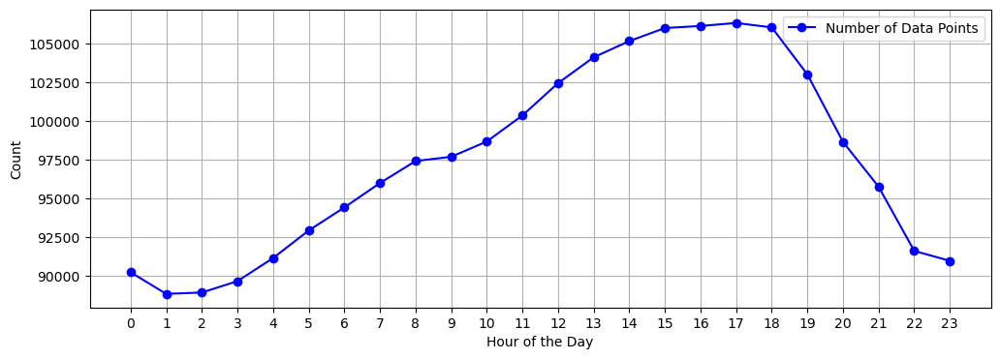

In [26]:
# Number of datapoints
hourly_counts = resampled_data.groupby(resampled_data['BaseDateTime'].dt.hour).size()

plt.figure(figsize=(12,4))
plt.plot(hourly_counts.index, hourly_counts.values, label='Number of Data Points', marker='o', linestyle='-', color='blue')

# plt.title('Number of Data Points at Each Hour of the Day')
plt.xlabel('Hour of the Day')
plt.ylabel('Count')
plt.legend()
plt.xticks(np.arange(24))
plt.grid(True)
plt.show()

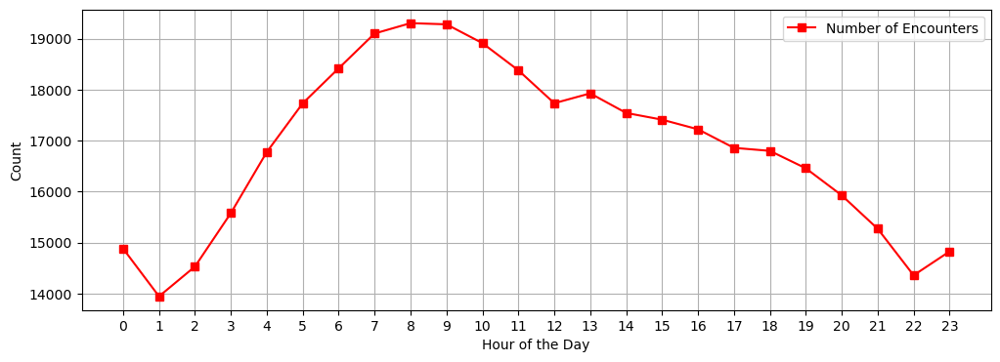

In [25]:
# number of encounters
hourly_encounters = resampled_data[resampled_data['Encountering'] == 1].groupby(resampled_data['BaseDateTime'].dt.hour).size()

# Plot the results
plt.figure(figsize=(12,4))
plt.plot(hourly_encounters.index, hourly_encounters.values, label='Number of Encounters', marker='s', linestyle='-', color='r')

# plt.title('Number of Encounters at Each Hour of the Day')
plt.xlabel('Hour of the Day')
plt.ylabel('Count')
plt.legend()
plt.xticks(np.arange(24))
plt.grid(True)
plt.show()

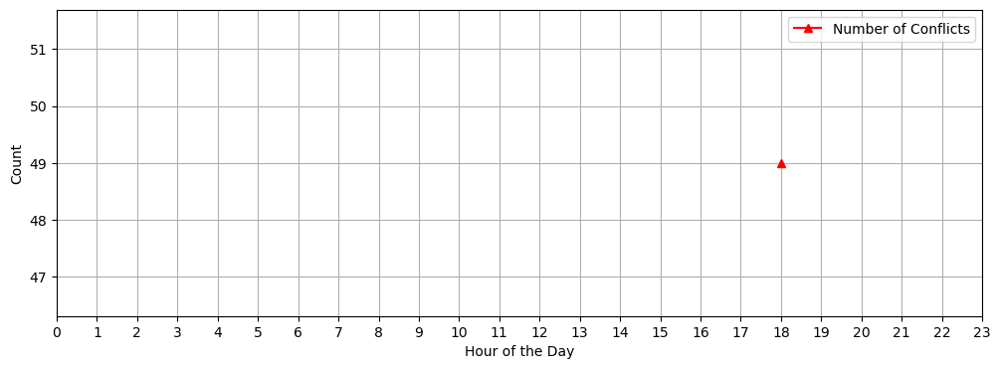

In [27]:
# Number of conflicts
hourly_conflicts = resampled_data[resampled_data['Conflicting'] == 1].groupby(resampled_data['BaseDateTime'].dt.hour).size()

plt.figure(figsize=(12,4))
plt.plot(hourly_conflicts.index, hourly_conflicts.values, label='Number of Conflicts', marker='^', linestyle='-', color='r')
plt.xlabel('Hour of the Day')
plt.ylabel('Count')
plt.legend()
plt.xticks(np.arange(24))
plt.grid(True)
plt.show()

In [28]:
resampled_data[resampled_data['Conflicting']==1].nunique()

Unnamed: 0             49
BaseDateTime           21
MMSI                    3
LAT                    36
LON                    38
SOG                    25
COG                    39
Navigation_sequence     3
i                       2
j                       3
Encountering            2
Conflicting             1
dtype: int64

## Case Study

In [28]:
start = '2021-04-24 18:00:00'
end = '2021-04-24 19:00:00'

data_18th_hr = resampled_data[(resampled_data['BaseDateTime'] >= start) & (resampled_data['BaseDateTime'] <= end)]
# sliced = sliced[(sliced['LON']<-80.10) & (sliced['LON']>-80.12)]

x_ref, y_ref = (-80.125, 26.08) # ref point to measure in dist
data_18th_hr['LON'] = data_18th_hr['LON'].apply(convert_x_to_meters, args=(x_ref,))
data_18th_hr['LAT'] = data_18th_hr['LAT'].apply(convert_y_to_meters, args=(y_ref,))

In [29]:
data_18th_hr

,BaseDateTime,MMSI,LAT,LON,SOG,COG,Navigation_sequence,i,j,Encountering,Conflicting
1370740,2021-04-24 18:00:00,371923000.0,2227.503011,13488.573164,6.8,143.6,2154,2.0,15.0,0,0
1370741,2021-04-24 18:00:00,338381848.0,2663.875415,428.777336,1.2,360.0,882,7.0,2.0,0,0
1370742,2021-04-24 18:00:00,378112072.0,4865.774943,3982.935693,7.4,184.8,2194,0.0,5.0,1,0
1370743,2021-04-24 18:00:00,366983050.0,2878.722032,1116.607442,0.8,58.0,1295,2.0,3.0,0,0
1370744,2021-04-24 18:00:00,367693520.0,2666.101804,587.335597,4.3,164.9,1569,7.0,2.0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
1371422,2021-04-24 19:00:00,366983050.0,4892.491620,835.222429,2.1,180.4,1295,0.0,2.0,0,0
1371423,2021-04-24 19:00:00,378112072.0,4865.774943,3982.935693,7.4,184.8,2194,0.0,5.0,1,0
1371424,2021-04-24 19:00:00,577403000.0,2734.006694,13520.954555,6.9,119.8,2396,2.0,15.0,0,0
1371425,2021-04-24 19:00:00,371923000.0,2227.503011,13488.573164,6.8,143.6,2154,2.0,15.0,0,0


In [30]:
data = data_18th_hr[(data_18th_hr['LAT']>0) & (data_18th_hr['LAT']<2500)]

In [31]:
data = data.drop(data[data['Navigation_sequence'] == 2154].index)

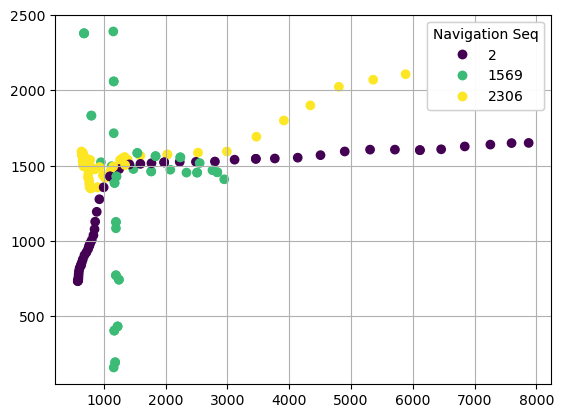

In [32]:
fig, ax = plt.subplots()

scatter = ax.scatter(x = data['LON'], 
                     y = data['LAT'], 
                     c = data['Navigation_sequence'])

legend1 = ax.legend(*scatter.legend_elements(), title="Navigation Seq")
ax.add_artist(legend1)

# ax.set_xlim(0, 8500)
# ax.set_ylim(0, 2500)
ax.grid(True)
plt.show()

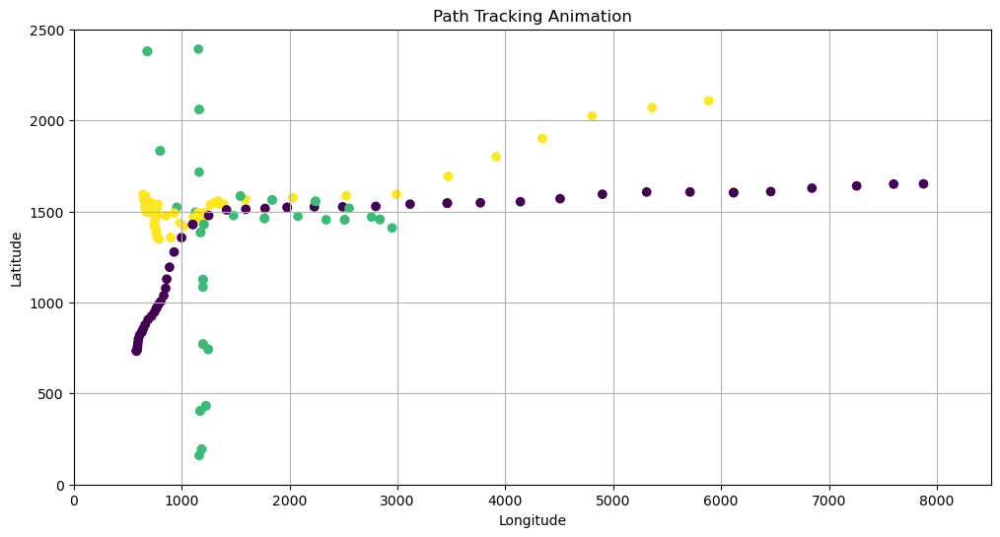

In [33]:
# Animation showcasing ship encounters in 18th hour of day

fig, ax = plt.subplots(figsize=(12, 6))
ax.plot([],[])

def update(frame):
    ax.clear()
    scatter = ax.scatter(x = data['LON'][:frame], 
                         y = data['LAT'][:frame], 
                         c = data['Navigation_sequence'][:frame])
    
#     ax.set_xlim(data_18th_hr['LON'].min(), data_18th_hr['LON'].max())
#     ax.set_ylim(data_18th_hr['LAT'].min(), data_18th_hr['LAT'].max())
#     legend1 = ax.legend(*scatter.legend_elements(), title="Navigation Sequence")
#     ax.add_artist(legend1)
    
    ax.set_xlim(0, 8500)
    ax.set_ylim(0, 2500)
    ax.set_xlabel('X (Kms)')
    ax.set_ylabel('Y (Kms)')
    ax.set_title('Path Tracking Animation')
    ax.grid(True)

# Create the animation
ani = FuncAnimation(fig, update, frames=data.shape[0], repeat=False)
HTML(ani.to_jshtml())

In [35]:
data.to_csv('Conflicts.csv')

In [ ]:
ani.save('conflicting.gif')

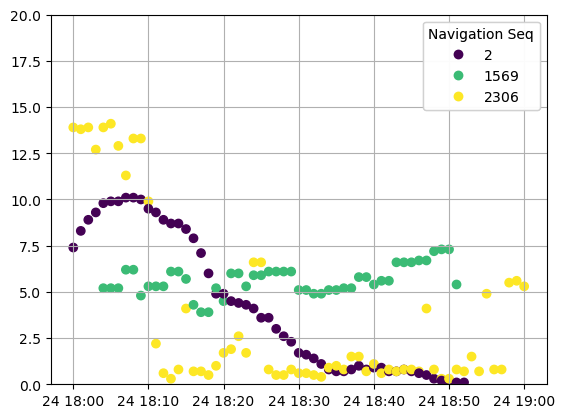

In [44]:
import matplotlib.ticker as ticker
fig, ax = plt.subplots()
scatter = ax.scatter(x = data['BaseDateTime'], 
                     y = data['SOG'], 
                     c = data['Navigation_sequence'])

legend1 = ax.legend(*scatter.legend_elements(), title="Navigation Seq")
ax.add_artist(legend1)
ax.set_ylim(0,20)
# ax.set_xticklabels(np.arange(24))
ax.grid(True)
plt.show()

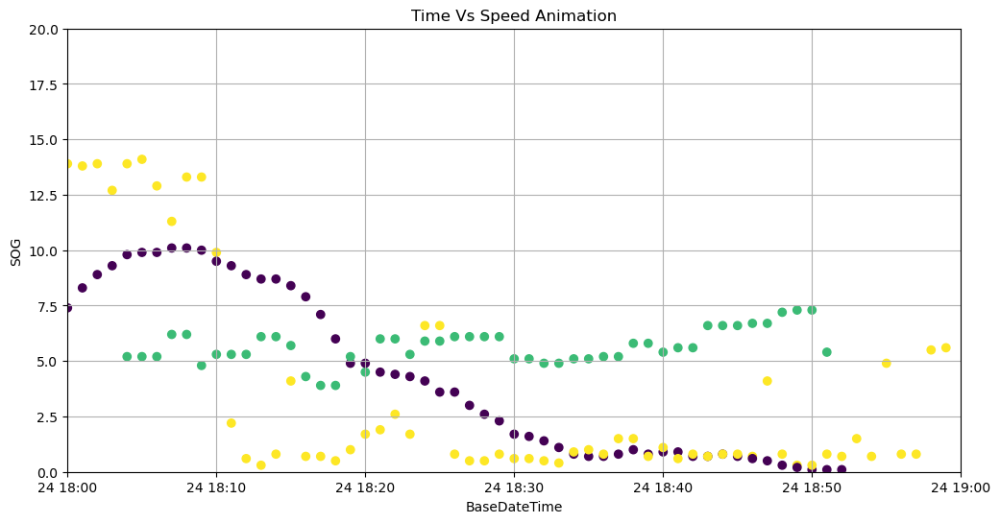

In [45]:
# Animation for speed vs time

fig, ax = plt.subplots(figsize=(12, 6))
ax.plot([],[])

def update(frame):
    ax.clear()
    scatter = ax.scatter(x = data['BaseDateTime'][:frame], 
                         y = data['SOG'][:frame], 
                         c = data['Navigation_sequence'][:frame])
    
#     ax.set_xlim(data_18th_hr['LON'].min(), data_18th_hr['LON'].max())
#     ax.set_ylim(data_18th_hr['LAT'].min(), data_18th_hr['LAT'].max())
#     legend1 = ax.legend(*scatter.legend_elements(), title="Navigation Sequence")
#     ax.add_artist(legend1)
    
    ax.set_xlim(min(data['BaseDateTime']), max(data['BaseDateTime']))
    ax.set_ylim(0, 20)
    ax.set_xlabel('BaseDateTime')
    ax.set_ylabel('SOG')
    ax.set_title('Time Vs Speed Animation')
    ax.grid(True)

# Create the animation
ani = FuncAnimation(fig, update, frames=data.shape[0], repeat=False)
HTML(ani.to_jshtml())

In [51]:
from matplotlib.animation import FuncAnimation, PillowWriter

In [59]:
ani.save('animation.gif')

MovieWriter ffmpeg unavailable; using Pillow instead.


In [35]:
sliced = sliced[(sliced['LAT']<26.10) &(sliced['LAT']>26.08)]

(26.08, 26.1)

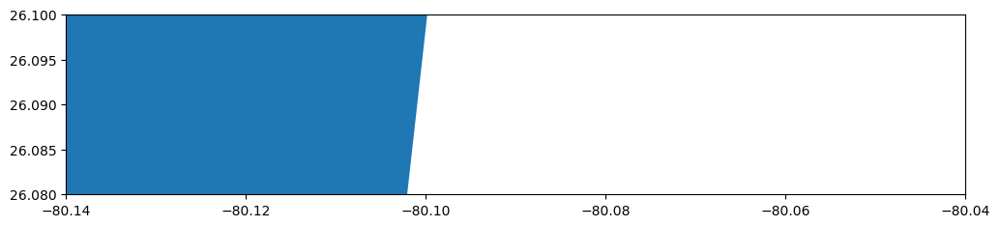

In [57]:
worldmap = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))

fig, ax = plt.subplots(figsize=(12, 6))
worldmap.plot( ax=ax)

ax.set_xlim(-80.14, -80.04)
ax.set_ylim(26.08, 26.10)

In [73]:
data

,BaseDateTime,MMSI,LAT,LON,SOG,COG,Navigation_sequence,i,j,Encountering,Conflicting
0,2021-02-27 12:52:00,205553000.0,26.10166,-80.00492,6.5,329.0,1,7.0,15.0,1,0
51,2021-02-27 13:43:00,205553000.0,26.12931,-80.06903,3.5,225.0,1,10.0,8.0,1,0
54,2021-02-27 13:46:00,205553000.0,26.12767,-80.07093,3.6,228.0,1,10.0,8.0,1,0
246,2021-04-24 17:51:00,205736000.0,26.09405,-80.04287,3.2,292.6,2,6.0,11.0,1,0
247,2021-04-24 17:52:00,205736000.0,26.09420,-80.04385,2.7,272.2,2,6.0,11.0,1,0
...,...,...,...,...,...,...,...,...,...,...,...
2342427,2021-01-30 18:43:00,985380125.0,26.10515,-80.11972,4.0,352.0,2459,7.0,2.0,1,0
2342430,2021-01-30 18:46:00,985380125.0,26.10913,-80.12021,5.2,18.3,2459,8.0,2.0,1,0
2342433,2021-01-30 18:49:00,985380125.0,26.11211,-80.11958,5.1,19.1,2459,8.0,2.0,1,0
2342541,2021-01-30 20:37:00,985380125.0,26.06427,-80.11701,6.2,248.0,2459,3.0,2.0,1,0


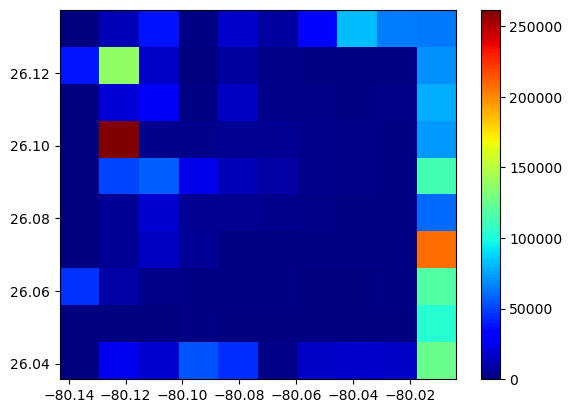

In [96]:
data = resampled_data[resampled_data['Encountering'] == 1]

plt.hist2d(x = resampled_data['LON'], y = resampled_data['LAT'],cmap=plt.cm.jet)
plt.colorbar()
# plt.xlim(-80.125, -80.04)
# plt.ylim(26.08, 26.13)
plt.show()

In [78]:
data.nunique()

BaseDateTime           139927
MMSI                      444
LAT                      7521
LON                      7714
SOG                       355
COG                      3599
Navigation_sequence      2072
i                          12
j                          16
Encountering                1
Conflicting                 2
dtype: int64

## Test Collsion

In [37]:
dumy = pd.read_csv('dummy_collision.csv')
dumy

,Unnamed: 0,Time,Ship_ID,Latitude,Longitude,SOG,COG
0,0,2023-01-01 00:00:00,Ship1,34.374540,-118.392455,2.554709,43.053929
1,1,2023-01-01 00:00:00,Ship2,34.950714,-118.829476,2.085396,256.768123
2,2,2023-01-01 00:00:00,Ship3,34.731994,-118.934948,4.314950,273.882618
3,3,2023-01-01 00:01:00,Ship1,34.388480,-118.404405,2.427013,202.059791
4,4,2023-01-01 00:01:00,Ship2,34.900635,-118.792867,2.123738,277.548185
5,5,2023-01-01 00:01:00,Ship3,34.706217,-118.886621,3.170784,177.766415
6,6,2023-01-01 00:02:00,Ship1,34.402420,-118.416354,1.563697,188.183819
7,7,2023-01-01 00:02:00,Ship2,34.850556,-118.756259,4.208788,153.914767
8,8,2023-01-01 00:02:00,Ship3,34.680440,-118.838293,1.298203,9.150886
9,9,2023-01-01 00:03:00,Ship1,34.416360,-118.428303,4.947548,38.840914


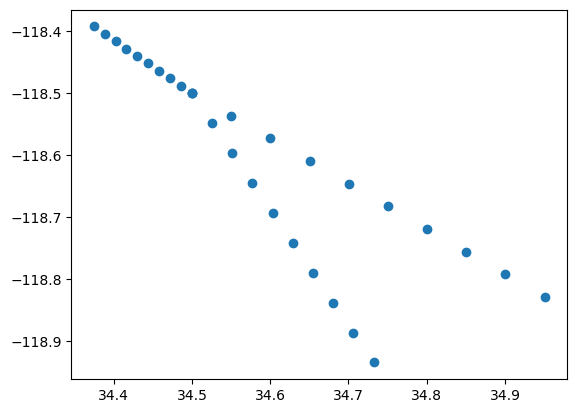

In [39]:
plt.scatter(x=dumy['Latitude'], y = dumy['Longitude'])